**End-To-End Multi class Dog Breed Classification**

Will be using Tensorflow and tensorflow hub for the same.

**Get Our Data Ready**

In [ ]:
#Import Tensorflow
import tensorflow as tf
import tensorflow_hub as hub
print("TF VERSION",tf.__version__)
print("TF Hub",hub.__version__)

#Check GPU
print("GPU","available (YESSSSS!!!!!)" if tf.config.list_physical_devices("GPU") else "not available")

TF VERSION 2.12.0
TF Hub 0.13.0
GPU available (YESSSSS!!!!!)


**Getting our data into tesnors**

That is with all ml models first you need to convert data into numerical format

In [ ]:
# Check the labels of our data
import pandas as pd
labels_csv=pd.read_csv("drive/MyDrive/Dog-vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: >

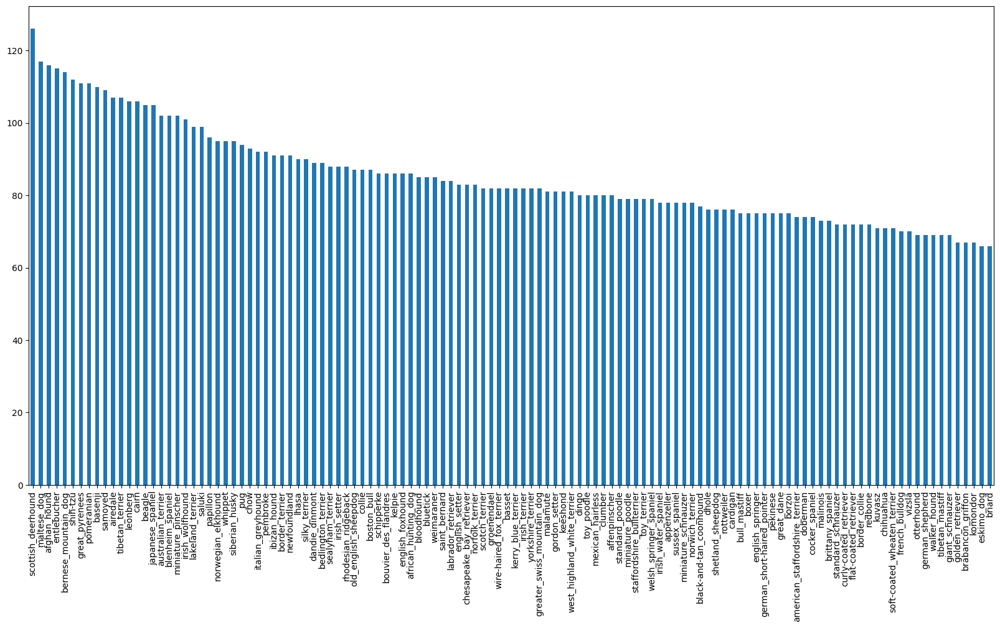

In [ ]:
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [ ]:
labels_csv["breed"].value_counts().mean()

85.18333333333334

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

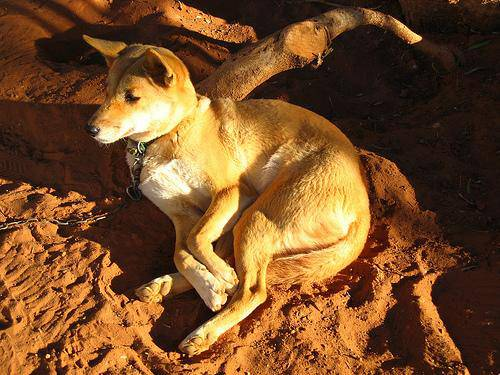

In [ ]:
#Lets view an image
from IPython.display import Image
Image("drive/MyDrive/Dog-vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

In [ ]:
# Create pathnames from Image Id's

filenames=["drive/MyDrive/Dog-vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]

#check it
filenames

['drive/MyDrive/Dog-vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog-vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog-vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog-vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog-vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog-vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog-vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog-vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog-vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog-vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg',
 'drive/MyDrive/Dog-vision/train/004396df1acd0f1247b740ca2b14616e.jpg',
 'drive/MyDrive/Dog-vision/train/0067dc3eab0b3c3ef0439477624d85d6.jpg',
 'drive/MyDrive/Dog-vision/train/00693b8bc2470375cc744a6391d397ec.jpg',
 'drive/MyDrive/Dog-vision/train/006cc3ddb9dc1bd827479569fcdc52d

In [ ]:
# Check wheather the number of filenames matches number of actual images
import os
if len(os.listdir("drive/MyDrive/Dog-vision/train/"))==len(filenames):
  print("Proceed")
else:
  print("Stop")



Stop


In [ ]:
len(filenames)

10222

In [ ]:
len(os.listdir("drive/MyDrive/Dog-vision/train/"))

10231

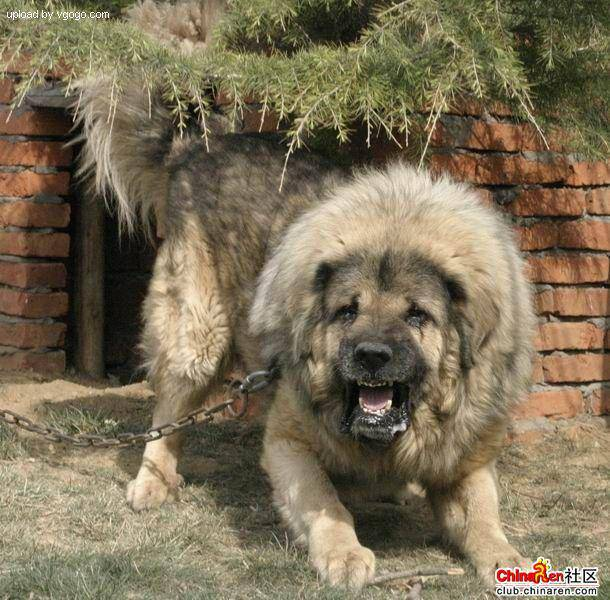

In [ ]:
Image(filenames[9000])

In [ ]:
import numpy as np
labels=labels_csv["breed"]
labels=np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
len(filenames)

10222

In [ ]:
# File name with unique
unique_breeds=np.unique(labels)
len(unique_breeds)

120

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0]==unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label into a bollean array
boolean_labels=[label==unique_breeds for label in labels]

In [ ]:
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Example Turning boolean array into integers
print(labels[0])
print(np.where(unique_breeds==labels[0]))#index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean arrays
print(boolean_labels[0].astype(int))# there will be a 1 where sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[2])
print(boolean_labels[2].astype(int))


pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
filenames[:10]

['drive/MyDrive/Dog-vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog-vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog-vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog-vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog-vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog-vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog-vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog-vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog-vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog-vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

**Creating own validation set**

In [ ]:
# Setup x and y
x=filenames
y=boolean_labels

We're going to start off experimenting with ~1000 images and increase as needed

In [ ]:
# Set number of images to use for exp
NUM_IMAGES=1000 #@param {type:"slider",min:1000,max:10000,step:100}

In [ ]:
# Lets split our data into train and validation sets
from sklearn.model_selection import train_test_split

x_train,x_val,y_train,y_val=train_test_split(x[:NUM_IMAGES],y[:NUM_IMAGES],test_size=0.2,random_state=42)

In [ ]:
len(x_train),len(x_val),len(y_train),len(y_val)

(800, 200, 800, 200)

In [ ]:
x_train[:2],y_train[:2]

(['drive/MyDrive/Dog-vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog-vision/train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, Fal

**Preprocessing Images (Turing images into tensors)**

In [ ]:
#Convert image to numpy array
from matplotlib.pyplot import imread
image=imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
image.max(),image.min()

(255, 0)

In [ ]:
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]],

       [[ 56, 104,  66],
        [ 58, 106,  66],
        [ 64, 112,  72],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 73, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  13],
        [  6,  15,  14],
        ...,
        [120, 113,  67],
        [126, 118,  72],
        [122, 114,  67]],

       [[  0,   4,   6],
        [  0,   9,   8],
        [  1,  10,   9],
        ...,
        [105,  98,  52],
        [111, 104,  58],
        [111, 103,  56]],

       [[ 18,  16,  37],
        [ 18,  18,  28],
        [ 17,  20,  11],
        ...,
        [101,  92,  5

In [ ]:
# Define image size
IMG_SIZE=224
#Create a function
def process_image(image_path,img_size=IMG_SIZE):
  image=tf.io.read_file(image_path)
  image=tf.image.decode_jpeg(image,channels=3)

  image=tf.image.convert_image_dtype(image,tf.float32)
  image=tf.image.resize(image,size=[IMG_SIZE,IMG_SIZE])

  return image

**Turing our data into batches**

In [ ]:
# Create a simple function to return a tuple (image,label)

def get_image_label(image_path,label):
  image=process_image(image_path)
  return image,label

In [ ]:
#Demo of above
(process_image(x[42]),tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [ ]:
# Define the batch size 32 is a good start
BATCH_SIZE=32

#Create a function to turn data into batches
def create_data_batches(x,y=None,batch_size=BATCH_SIZE,valid_data=False,test_data=False):
  # If the data is a test dataset we probably don't have the labels
  if test_data:
    print("Creating test data bacthes")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x)))# Only filepaths
    data_batch=data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  elif valid_data:
    print("Creating validation batches")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x),tf.constant(y)))
    data_batch=data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(x),tf.constant(y)))
    data=data.shuffle(buffer_size=len(x))
    data=data.map(get_image_label)

    data_batch=data.batch(BATCH_SIZE)
    return data_batch


In [ ]:
# Create training and validation data batches
train_data=create_data_batches(x_train,y_train)
val_data=create_data_batches(x_val,y_val,valid_data=True)

Creating training data batches
Creating validation batches


In [ ]:
# Check out the different attribute of oyr data
train_data.element_spec,val_data.element_spec


((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [ ]:
import matplotlib.pyplot as plt

def show_25_images(images,labels):
  """
  Displays a plot of 25 images
  """

  plt.figure(figsize=(10,10))

  for i in range(25):
    ax=plt.subplot(5,5,i+1)

    plt.imshow(images[i])

    plt.title(unique_breeds[labels[i].argmax()])

In [ ]:
train_images,train_labels=next(train_data.as_numpy_iterator())

In [ ]:
train_images,train_labels


(array([[[[2.65161067e-01, 2.33788535e-01, 1.90651283e-01],
          [2.77836144e-01, 2.46463597e-01, 2.03326344e-01],
          [2.85959393e-01, 2.54586846e-01, 2.11449593e-01],
          ...,
          [6.98415697e-01, 6.74886286e-01, 5.34340024e-01],
          [7.00043738e-01, 6.79840624e-01, 5.67900956e-01],
          [6.82755768e-01, 6.59226358e-01, 5.57265580e-01]],
 
         [[2.65161067e-01, 2.33788535e-01, 1.90651283e-01],
          [2.77836144e-01, 2.46463597e-01, 2.03326344e-01],
          [2.85959393e-01, 2.54586846e-01, 2.11449593e-01],
          ...,
          [7.04578161e-01, 6.81048751e-01, 5.40502548e-01],
          [6.96848691e-01, 6.76645577e-01, 5.64705908e-01],
          [6.79341674e-01, 6.55812263e-01, 5.53851485e-01]],
 
         [[2.65161067e-01, 2.33788535e-01, 1.90651283e-01],
          [2.77836144e-01, 2.46463597e-01, 2.03326344e-01],
          [2.85959393e-01, 2.54586846e-01, 2.11449593e-01],
          ...,
          [6.98228955e-01, 6.74699545e-01, 5.3415

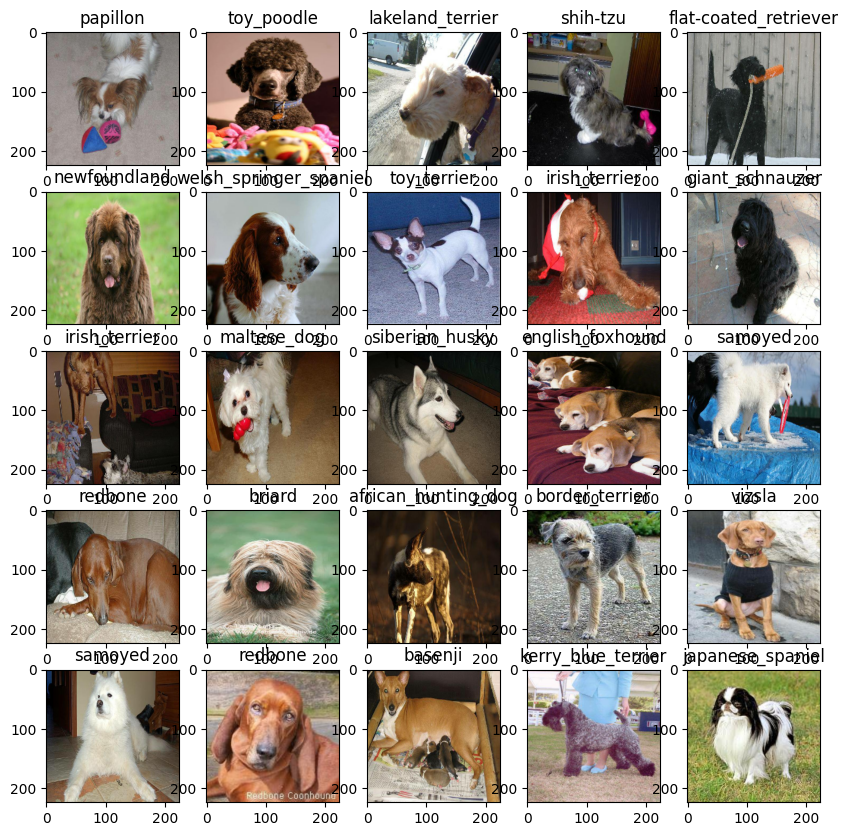

In [ ]:
# Lets visualize the data
show_25_images(train_images,train_labels)

**Building a model**

Before we build a model there are few things we need to define:
 * The input shape
 * The output shape
 * The URL of the model we want to use  (Transfer Learning Concept)

In [ ]:
# Setup input shape to the model

INPUT_SHAPE=[None,IMG_SIZE,IMG_SIZE,3]

OUTPUT_SHAPE=len(unique_breeds)

MODEL_URL="https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

In [ ]:
# Create a function which builds a keras model
def create_model(input_shape=INPUT_SHAPE,output_shape=OUTPUT_SHAPE,model_url=MODEL_URL):
  print("BUILDING MODEL WITH ",MODEL_URL)

  #Setup the model layers
  model=tf.keras.Sequential([hub.KerasLayer(MODEL_URL)
  ,tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                         activation="softmax")])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model


In [ ]:
model=create_model()
model.summary()


BUILDING MODEL WITH  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


**Creating CallBacks**

callbacks are helper function a model can use during training to do such things as save its progress ,check its progress or stop training early if a model stops imroving.

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime
def create_tensorboard_callback():
  logdir=os.path.join("drive/MyDrive/Dog-vision/logs",
                      datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

In [ ]:
# Early Stopping Callback
# It will help in stopping our model from overfitting by stopping training if a certain evaluation mertics has stopped improving

early_stopping=tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",patience=3)

**Training a Model**

Our first model will only be trained on 1000 images to make sure everything is working smoothly.

In [ ]:
NUM_EPOCHS=100 #@param {type:"slider",min:10,max:100,step:10}

In [ ]:
# Check to make sure if we have gpu
print("GPU","AVAILABLE(YESSSS)"if tf.config.list_physical_devices("GPU") else "not available")

GPU AVAILABLE(YESSSS)


In [ ]:
# Build a function to train and return trained model
def train_model():
  model=create_model()

  tensorboard=create_tensorboard_callback()
  model.fit(x=train_data,epochs=NUM_EPOCS,validation_data=val_data,validation_freq=1,callbacks=[tensorboard,early_stopping])

  return model

In [ ]:
model=train_model()

BUILDING MODEL WITH  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 351s 14s/step - loss: 4.6370 - accuracy: 0.0938 - val_loss: 3.5653 - val_accuracy: 0.2450
Epoch 2/100
25/25 [==============================] - 3s 114ms/step - loss: 1.6432 - accuracy: 0.6888 - val_loss: 2.3037 - val_accuracy: 0.4550
Epoch 3/100
25/25 [==============================] - 4s 147ms/step - loss: 0.5600 - accuracy: 0.9425 - val_loss: 1.8003 - val_accuracy: 0.5500
Epoch 4/100
25/25 [==============================] - 3s 137ms/step - loss: 0.2479 - accuracy: 0.9912 - val_loss: 1.5996 - val_accuracy: 0.6100
Epoch 5/100
25/25 [==============================] - 3s 114ms/step - loss: 0.1462 - accuracy: 0.9975 - val_loss: 1.5198 - val_accuracy: 0.6250
Epoch 6/100
25/25 [==============================] - 3s 116ms/step - loss: 0.1006 - accuracy: 0.9987 - val_loss: 1.4695 - val_accuracy: 0.6350
Epoch 7/100
25/25 [==============================

In [ ]:
# Checking TensorBoard logs
%tensorboard --logdir drive/MyDrive/Dog-vision/logs/

<IPython.core.display.Javascript object>

In [ ]:
# Making and evaluating predictions using a trained model
predictions=model.predict(val_data,verbose=1)
predictions

7/7 [==============================] - 1s 91ms/step


array([[1.28228671e-03, 4.07974330e-05, 1.31633889e-03, ...,
        9.28593567e-04, 1.03639715e-04, 3.99408070e-03],
       [1.89581467e-03, 5.83766610e-04, 9.46991220e-02, ...,
        8.46998068e-04, 2.24241102e-03, 6.45873777e-04],
       [9.94382572e-06, 1.40514559e-04, 4.99816051e-05, ...,
        1.71689666e-04, 1.17299547e-04, 3.39617145e-05],
       ...,
       [2.40195459e-06, 3.72171235e-05, 1.99753867e-06, ...,
        1.84902583e-05, 1.34683432e-05, 8.17776345e-06],
       [9.83992941e-04, 9.87754611e-05, 8.09093326e-05, ...,
        2.35839951e-04, 1.25588140e-05, 1.08098937e-02],
       [7.44021556e-04, 7.47418062e-06, 2.30122847e-03, ...,
        1.15526533e-02, 2.12479805e-04, 1.48981999e-05]], dtype=float32)

In [ ]:
index=42
print(predictions[index])
print(f"Max value (Probability of prediction): {np.max(predictions[index])}")
print(f"Predicted Label: {unique_breeds[np.argmax(predictions[index])]}")

[3.87387845e-05 1.13430971e-04 1.27323277e-04 3.64979387e-05
 1.70875387e-03 5.25730684e-05 3.65319574e-05 7.13386282e-04
 6.56390190e-03 2.87762117e-02 2.07816229e-05 1.27009944e-05
 2.44303810e-04 4.22168663e-03 7.97535700e-04 2.17511714e-03
 9.61273872e-06 1.08814740e-04 4.88900114e-05 9.20483144e-04
 1.28223455e-05 3.43338063e-04 1.14853628e-05 1.03647671e-05
 1.16583137e-02 6.25057000e-05 5.71409910e-05 1.12291040e-04
 1.22052588e-04 1.73903609e-05 3.49741531e-05 1.71947413e-05
 4.52900531e-05 2.57132979e-05 7.74739092e-05 3.08405724e-05
 4.37332856e-05 3.73209565e-04 1.99367205e-05 2.29494229e-01
 1.60259529e-04 1.45568065e-05 2.14298558e-03 1.46358298e-05
 4.14862996e-04 6.46957415e-06 1.95277316e-04 5.90307696e-04
 9.06023888e-06 6.05922251e-04 2.71205572e-05 7.87990866e-05
 4.82658943e-04 1.42734288e-03 2.77919698e-05 5.01292292e-04
 3.29735776e-05 1.20508676e-05 1.58812647e-04 8.21724607e-05
 2.05233373e-05 2.28997276e-04 5.08452013e-06 2.22023009e-05
 1.96451670e-04 1.065640

In [ ]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  return unique_breeds[np.argmax(prediction_probabilities)]

#Get a predicted label based on an array of preiction probabilities
pred_label=get_pred_label(predictions[81])
pred_label

'dingo'

In [ ]:
# Create a function to unbatch a batch

images_=[]
labels_=[]

# Loop through unbtached data
for image,label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)

images_[0],labels_[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(labels_[0])

'cairn'

In [ ]:
get_pred_label(predictions[0])

'cairn'

In [ ]:
# Create a function to unbatch

def unbatchify(data):
  images=[]
  labels=[]

  for image,label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])

  return images,labels

val_images,val_labels=unbatchify(val_data)
val_images[0],val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
# Visualize
def plot_pred(prediction_probabilities,labels,images,n=1):
  pred_prob,true_label,image=prediction_probabilities[n],labels[n],images[n]

  # Get the pred label
  pred_label=get_pred_label(pred_prob)

  #plot image and remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label==true_label:
    color="green"
  else:
    color="red"

  # Change plot title to be predicted probability of prediction and truth label
  plt.title("{}{:2.0f}% {}".format(pred_label,np.max(pred_prob)*100,true_label),color=color)


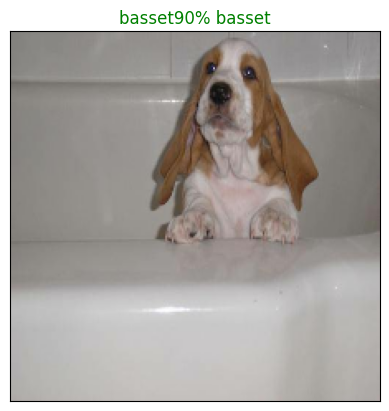

In [ ]:
plot_pred(prediction_probabilities=predictions,labels=val_labels,images=val_images,n=2)

In [ ]:
# We will now see top 10 prediction of the picture
def plot_pred_conf(prediction_probabilites,labels,n=1):
  pred_prob,true_label=prediction_probabilites[n], labels[n]

  # Get the predicted label
  pred_label=get_pred_label(pred_prob)
  # Find the top 10 predictions
  top_10_pred_indexes=pred_prob.argsort()[-10:][::-1]

  top_10_pred_values=pred_prob[top_10_pred_indexes]
  top_10_pred_labels=unique_breeds[top_10_pred_indexes]

  # Plot
  top_plot=plt.bar(np.arange(len(top_10_pred_labels)),top_10_pred_values,color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),labels=top_10_pred_labels,rotation="vertical")

  # Change the color of true label
  if np.isin(true_label,top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

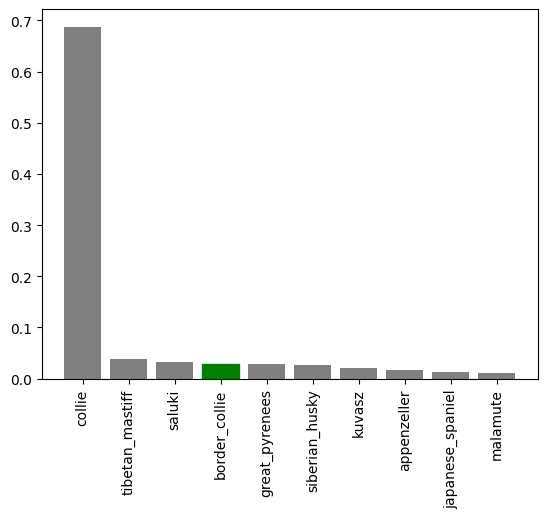

In [ ]:
plot_pred_conf(prediction_probabilites=predictions,labels=val_labels,n=9)

**Visualizing amazingly**

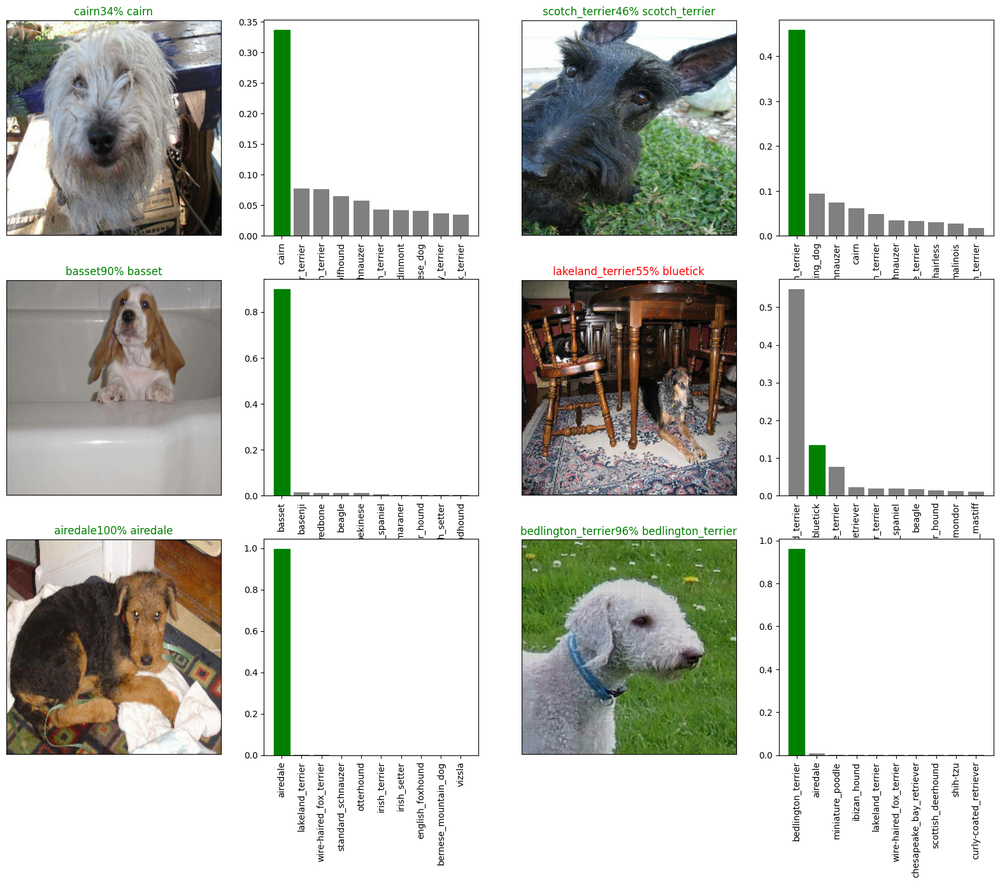

In [ ]:
i_multiplier=0
num_rows=3
num_cols=2
num_images=num_rows*num_cols
plt.figure(figsize=(10*num_cols,5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows,2*num_cols,2*i+1)
  plot_pred(prediction_probabilities=predictions,labels=val_labels,images=val_images,n=i+i_multiplier)
  plt.subplot(num_rows,2*num_cols,2*i+2)
  plot_pred_conf(prediction_probabilites=predictions,labels=val_labels,n=i+i_multiplier)

**Save Model**

In [ ]:
# Create a function to save a model
def save_model(model,suffix=None):
  modeldir=os.path.join("drive/MyDrive/Dog-vision/Models",datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path=modeldir + "-" + suffix + ".h5"
  print(f"Saving model to : {model_path}...")
  model.save(model_path)
  return model_path


In [ ]:
# Create a function to relaod the model
def load_model(model_path):
  print(f"Loading save model from {model_path}")
  model=tf.keras.models.load_model(model_path,custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [ ]:
# Save a modeling trained on 1000
save_model(model,suffix="1000-images-mobilenetv2-Adam")

Saving model to : drive/MyDrive/Dog-vision/Models/20230704-07241688455495-1000-images-mobilenetv2-Adam.h5...


'drive/MyDrive/Dog-vision/Models/20230704-07241688455495-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Load a trained model
loaded_1000_image_model=load_model("drive/MyDrive/Dog-vision/Models/20230704-07241688455495-1000-images-mobilenetv2-Adam.h5")

Loading save model from drive/MyDrive/Dog-vision/Models/20230704-07241688455495-1000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 134ms/step - loss: 1.3560 - accuracy: 0.6400


[1.3560372591018677, 0.6399999856948853]

In [ ]:
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 2s 109ms/step - loss: 1.3560 - accuracy: 0.6400


[1.3560372591018677, 0.6399999856948853]

**Learning on 10000+ images**

In [ ]:
len(x),len(y)

(10222, 10222)

In [ ]:
# Create a data batch with full data set
full_data=create_data_batches(x,y)

Creating training data batches


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
full_model=create_model()

BUILDING MODEL WITH  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
# Create full model callbacks
full_model_tensorboard=create_tensorboard_callback()
#No validation set when training on all the data so we can't monitor validation accuracy
full_model_early_stopping=tf.keras.callbacks.EarlyStopping(monitor="accuracy",patience=3)

In [ ]:
# Fit the full data set
full_model.fit(x=full_data,epochs=NUM_EPOCHS,callbacks=[full_model_tensorboard,full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 39s 99ms/step - loss: 1.3413 - accuracy: 0.6704
Epoch 2/100
320/320 [==============================] - 32s 99ms/step - loss: 0.4008 - accuracy: 0.8839
Epoch 3/100
320/320 [==============================] - 33s 102ms/step - loss: 0.2376 - accuracy: 0.9362
Epoch 4/100
320/320 [==============================] - 32s 100ms/step - loss: 0.1563 - accuracy: 0.9634
Epoch 5/100
320/320 [==============================] - 32s 99ms/step - loss: 0.1065 - accuracy: 0.9776
Epoch 6/100
320/320 [==============================] - 32s 99ms/step - loss: 0.0785 - accuracy: 0.9860
Epoch 7/100
320/320 [==============================] - 32s 101ms/step - loss: 0.0598 - accuracy: 0.9911
Epoch 8/100
320/320 [==============================] - 33s 102ms/step - loss: 0.0462 - accuracy: 0.9945
Epoch 9/100
320/320 [==============================] - 33s 101ms/step - loss: 0.0384 - accuracy: 0.9954
Epoch 10/100
320/320 [==============================] - 33s 102ms/st

In [ ]:
save_model(full_model,suffix="full-image-set-mobilenetv2-Adam")

Saving model to : drive/MyDrive/Dog-vision/Models/20230704-09231688462598-full-image-set-mobilenetv2-Adam.h5...


'drive/MyDrive/Dog-vision/Models/20230704-09231688462598-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
loaded_full_model=load_model("drive/MyDrive/Dog-vision/Models/20230704-09231688462598-full-image-set-mobilenetv2-Adam.h5")

Loading save model from drive/MyDrive/Dog-vision/Models/20230704-09231688462598-full-image-set-mobilenetv2-Adam.h5


**Making Predictions on Test Data**

In [ ]:
# Load the test image filename
test_path="drive/MyDrive/Dog-vision/test/"
test_filenames=[test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog-vision/test/e78d3997b4e7f4abc1299f81b8e3b2d9.jpg',
 'drive/MyDrive/Dog-vision/test/e83fec66a32873298df9fa5fdac113aa.jpg',
 'drive/MyDrive/Dog-vision/test/e7e9624f2a2e61ab187358f5968bfde8.jpg',
 'drive/MyDrive/Dog-vision/test/e7e9dd51302fe08c1c89a550e183cf07.jpg',
 'drive/MyDrive/Dog-vision/test/e7b4b0e7d7d76f8dbd64920f34443b25.jpg',
 'drive/MyDrive/Dog-vision/test/e83d7fa8fdfba0ec577f9c8df811d439.jpg',
 'drive/MyDrive/Dog-vision/test/e8319b1410a984291d71a3e60c84d86c.jpg',
 'drive/MyDrive/Dog-vision/test/e76a58909e6e1196bdefb3105060bcbe.jpg',
 'drive/MyDrive/Dog-vision/test/e826c0ae5dd27876781c10e1be444fd5.jpg',
 'drive/MyDrive/Dog-vision/test/e7feb64da6aae1ef8e62453f6660d0c5.jpg']

In [ ]:
len(test_filenames)

10367

In [ ]:
# Creating batches
test_data=create_data_batches(test_filenames,test_data=True)

Creating test data bacthes


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
#Make predictions on test data batch using the loaded full model
test_predictions=loaded_full_model.predict(test_data,verbose=1)

324/324 [==============================] - 3860s 12s/step


In [ ]:
np.savetxt("drive/MyDrive/Dog-vision/preds_array2.csv",test_predictions,delimiter=",")

In [ ]:
import numpy as np

In [ ]:
test_predictions=np.loadtxt("drive/MyDrive/Dog-vision/preds_array.csv",delimiter=",")

In [ ]:
test_predictions[:10]

array([[1.14598722e-08, 2.78218421e-13, 1.38220839e-08, ...,
        6.05276274e-10, 2.36076458e-12, 4.60240308e-08],
       [1.54979212e-08, 5.00398079e-09, 3.54651170e-10, ...,
        1.08356693e-08, 4.10485903e-08, 3.02561615e-10],
       [3.20719118e-09, 2.62192906e-10, 7.59373731e-10, ...,
        4.70637085e-10, 4.08717227e-10, 2.40253795e-09],
       ...,
       [4.42267681e-11, 9.36548686e-11, 1.35407813e-11, ...,
        1.70946052e-11, 1.05292710e-11, 1.06330808e-12],
       [4.76385632e-11, 2.77786150e-09, 2.23535371e-10, ...,
        1.09719700e-09, 3.92570915e-12, 2.82642937e-11],
       [3.40619209e-07, 3.12057200e-05, 3.04411496e-09, ...,
        4.91871655e-09, 6.88022865e-08, 3.12782708e-04]])

In [ ]:
test_predictions.shape

(10367, 120)

In [ ]:
# Submission on kaggle format
preds_df=pd.DataFrame(columns=["id"]+list(unique_breeds))

In [ ]:
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
test_path="drive/MyDrive/Dog-vision/test/"

In [ ]:
test_ids=[os.path.splitext(path)[0] for path in os.listdir(test_path)]

In [ ]:
test_ids

['e78d3997b4e7f4abc1299f81b8e3b2d9',
 'e83fec66a32873298df9fa5fdac113aa',
 'e7e9624f2a2e61ab187358f5968bfde8',
 'e7e9dd51302fe08c1c89a550e183cf07',
 'e7b4b0e7d7d76f8dbd64920f34443b25',
 'e83d7fa8fdfba0ec577f9c8df811d439',
 'e8319b1410a984291d71a3e60c84d86c',
 'e76a58909e6e1196bdefb3105060bcbe',
 'e826c0ae5dd27876781c10e1be444fd5',
 'e7feb64da6aae1ef8e62453f6660d0c5',
 'e864985e40823a56d3ad8594066d0641',
 'e752d87634c6177a748d655a55aeec89',
 'e7afcce6e45858fc3b294cc5c0b15a53',
 'e76a7a1d23d687b5015b07df762c0c10',
 'e816f0027a2c6348dbf12b79c70541bc',
 'e806fbb5ca4dd3a094f7819bd810cc65',
 'e85b19a69be67eaef9fe58b7e689ee81',
 'e807c4b5025b0aa4dcbd5df2765aa8e4',
 'e774fbfeb4b712ca042f93edea3835af',
 'e8889cf9d7b2701a85be1c97661b9b26',
 'e87771bc542cc6112c922962d8fda92b',
 'e8232c9a79f0e77e9b4c5fca60682d41',
 'e7b357150635c250757363718e4dae86',
 'e7b608110b0e29120d8740f37e85f3d0',
 'e85d4e2707683df0e6387e19b67b873d',
 'e751e319cfdc9912ae2e5da2a9b053e0',
 'e806a67a05289ac6de6831001664b81b',
 

In [ ]:
preds_df["id"]=test_ids

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e78d3997b4e7f4abc1299f81b8e3b2d9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e83fec66a32873298df9fa5fdac113aa,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e7e9624f2a2e61ab187358f5968bfde8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e7e9dd51302fe08c1c89a550e183cf07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e7b4b0e7d7d76f8dbd64920f34443b25,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
preds_df[list(unique_breeds)]=test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e78d3997b4e7f4abc1299f81b8e3b2d9,1.145987e-08,2.782184e-13,1.382208e-08,2.287096e-13,3.135301e-11,3.235912e-11,9.705539e-09,4.478994e-09,1.230648e-11,...,1.576549e-08,4.080578e-07,1.965463e-11,1.319784e-10,1.054174e-11,2.295786e-12,9.788957e-09,6.052763e-10,2.360765e-12,4.602403e-08
1,e83fec66a32873298df9fa5fdac113aa,1.549792e-08,5.003981e-09,3.546512e-10,6.917495e-13,3.698083e-12,1.481498e-09,3.126860e-11,1.483871e-12,1.127830e-12,...,1.204923e-11,1.645944e-10,4.433827e-11,1.379443e-10,1.167724e-08,1.479154e-13,8.483248e-11,1.083567e-08,4.104859e-08,3.025616e-10
2,e7e9624f2a2e61ab187358f5968bfde8,3.207191e-09,2.621929e-10,7.593737e-10,2.859363e-11,2.730546e-08,9.970217e-09,1.231799e-11,8.232134e-09,5.872594e-08,...,1.633422e-08,1.673191e-08,9.690547e-08,5.651548e-09,4.848308e-10,6.385203e-08,4.668528e-09,4.706371e-10,4.087172e-10,2.402538e-09
3,e7e9dd51302fe08c1c89a550e183cf07,3.348358e-04,2.763387e-08,9.000575e-09,1.539610e-07,1.692226e-07,1.663374e-09,4.574255e-02,6.676453e-08,7.725249e-10,...,5.048608e-08,8.029643e-04,8.605101e-09,3.502245e-10,2.432978e-09,4.042225e-09,1.469373e-06,9.908612e-08,2.524614e-06,9.506758e-01
4,e7b4b0e7d7d76f8dbd64920f34443b25,3.519597e-10,7.535896e-11,2.644786e-09,3.437204e-08,1.341429e-04,1.246916e-09,3.186438e-09,2.593144e-11,1.291020e-07,...,2.446060e-09,1.669306e-09,7.732114e-01,1.355045e-03,5.954309e-02,1.400173e-10,2.210778e-10,1.392679e-07,1.833562e-06,3.225956e-08


In [ ]:
len(preds_df)

10367

In [ ]:
boolean=not preds_df["id"].is_unique

In [ ]:
boolean

False

In [ ]:
dup=preds_df.duplicated(subset=["id"]).any()
dup

False

In [ ]:
preds_df.to_csv("drive/MyDrive/Dog-vision/Submission-Dog-vision-Kaggle-Final.csv",index=False)

In [ ]:
# Get custom image filepaths
import os
custom_path="drive/MyDrive/Dog-vision/Dog-Photos"
custom_image_paths=[custom_path + fname for fname in os.listdir(custom_path)]